# Tutorial - Creating a map and KDE plot of points and polygons with Python

In [46]:
import numpy as np 
import pandas as pd
import geopandas as gpd 
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from matplotlib.path import Path
from matplotlib.textpath import TextToPath

import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

import seaborn as sns
import shapely.speedups
shapely.speedups.enable()

Download the following data and save extract it into the ./data folder of this project:

- http://download.geofabrik.de/europe/netherlands/noord-holland-latest-free.shp.zip

- https://maps.amsterdam.nl/open_geodata/geojson.php?KAARTLAAG=GEBIED_STADSDELEN&THEMA=gebiedsindeling

## Loading and preprocessing the data

Load the POI data:

In [47]:
points = gpd.read_file("./data/gis_osm_pois_free_1.shp")

filter the data for restaurants (or any other POI category)

In [48]:
points = points[points["fclass"] == "restaurant"]

take a quick look into the data

In [49]:
points

,osm_id,code,fclass,name,geometry
92,30839687,2301,restaurant,de Eethoek,POINT (4.68719 52.60357)
144,34043796,2301,restaurant,Sizzling Wok,POINT (4.94756 52.29292)
146,34044093,2301,restaurant,De Roode Leeuw,POINT (4.89360 52.37375)
309,94829656,2301,restaurant,Pata Negra,POINT (4.92517 52.36060)
314,95288389,2301,restaurant,Meram,POINT (4.92556 52.35599)
...,...,...,...,...,...
36941,7124541137,2301,restaurant,Bregje,POINT (4.54346 52.40140)
37028,7125482608,2301,restaurant,Bregje,POINT (5.16396 52.27562)
37099,7126562153,2301,restaurant,Antiek China,POINT (4.69355 52.70252)
37100,7126562155,2301,restaurant,Duinberk,POINT (4.69367 52.70238)


load the shapefile for the city of amsterdam

In [50]:
city = gpd.read_file("./data/geojson.json")

take a quick look into this data as well

In [51]:
city

,Stadsdeel_code,Stadsdeel,Opp_m2,geometry
0,A,Centrum,8043500,"POLYGON ((4.93298 52.37039, 4.93295 52.37053, ..."
1,B,Westpoort,28991600,"POLYGON ((4.88587 52.39936, 4.88271 52.40169, ..."
2,E,West,10629900,"POLYGON ((4.89509 52.38868, 4.89468 52.38993, ..."
3,F,Nieuw-West,38015500,"POLYGON ((4.85050 52.36423, 4.85046 52.36518, ..."
4,K,Zuid,17274000,"POLYGON ((4.91499 52.34213, 4.91495 52.34242, ..."
5,M,Oost,30594900,"POLYGON ((5.03906 52.35456, 5.03882 52.35809, ..."
6,N,Noord,63828800,"POLYGON ((5.07917 52.38864, 5.07427 52.41383, ..."
7,T,Zuidoost,22113700,"POLYGON ((5.02155 52.30244, 5.02147 52.30312, ..."


perform a spatial join between the points and polygons and filter out any points that did not match with the polygons

In [52]:
points = gpd.sjoin(points, city, how="left")
points = points.dropna(subset=["index_right"])

plot both data sets to see if the spatial join was performed correctly

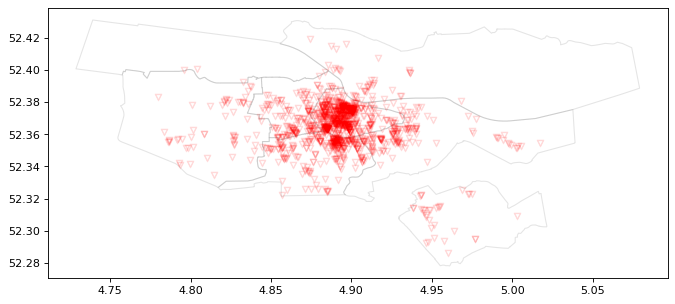

In [53]:
# edit the figure size however you need to
plt.figure(num=None, figsize=(10,10), dpi=80, facecolor='w', edgecolor='k')
# create plot and axes
fig = plt.plot()
ax1 = plt.axes()
# these values can be changed as needed, the markers are LaTeX symbols
city.plot(ax=ax1, alpha=0.1, edgecolor="black", facecolor="white")
points.plot(ax=ax1, alpha = 0.1, color="red", marker='$\\bigtriangledown$',)
ax1.figure.savefig('./data/plot1.png', bbox_inches='tight')

## Add a background map to the plot

to get a nice background map, we need to find out all the boundaries of our data and save that for later plotting

In [54]:
bounding_box = [points["geometry"].x.min(), points["geometry"].x.max(), points["geometry"].y.min(), points["geometry"].y.max()]

In [55]:
bounding_box

[4.7799629, 5.0172533, 52.2864691, 52.4193587]

Use these bounding box values and put them into the area fields on this website: https://www.openstreetmap.org/export#map=12/52.3530/4.8556 the area should look like this:

![screenshot](resources/img.png)

You can save the image by clicking on the share button on the right and save it as a PNG-file with the name `map.png`.

load the background map

In [56]:
osm_map = plt.imread("./data/map.png")

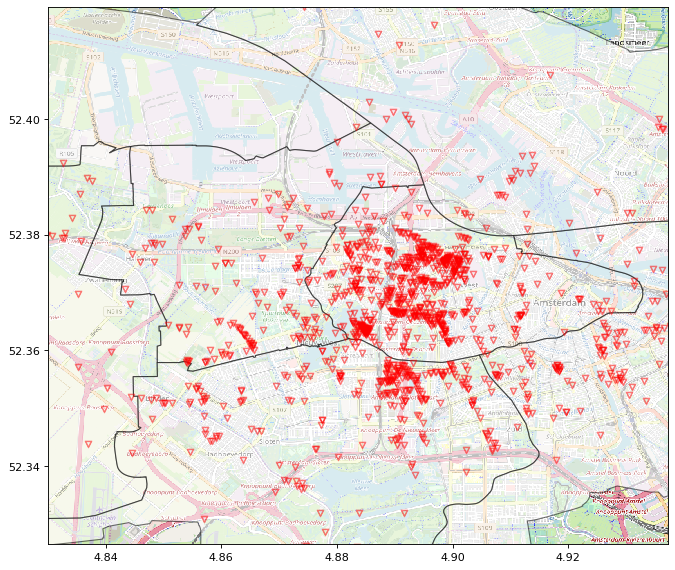

In [57]:
plt.figure(num=None, figsize=(10,10), dpi=80, facecolor='w', edgecolor='k')

fig = plt.plot()
ax1 = plt.axes()
# to see more of the data, we use the bounding box and zoom in a little by adding and subtracting values of our borders
ax1.set_xlim(bounding_box[0]+0.05, bounding_box[1]-0.08)
ax1.set_ylim(bounding_box[2]+0.04, bounding_box[3])
city.plot(ax=ax1, alpha=0.55, edgecolor="black", facecolor="white")
points.plot(ax=ax1, alpha = 0.4, color="red", marker='$\\bigtriangledown$',)
# add the osm_map as a background to the extend of the bounding box
ax1.imshow(osm_map, zorder=0, extent = bounding_box)
ax1.figure.savefig('./data/plot2.png', bbox_inches='tight')

## Show a KDE plot of the spatial distribution

To get an impression on the spatial distribution, a KDE plot might help. For this we use the `kdeplot`-function from seaborn.

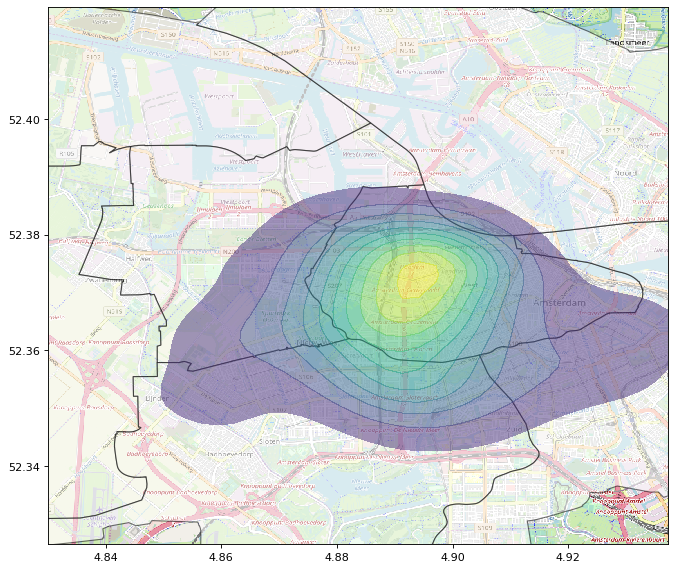

In [58]:
plt.figure(num=None, figsize=(10,10), dpi=80, facecolor='w', edgecolor='k')
fig = plt.plot()
ax1 = plt.axes()
ax1.set_xlim(bounding_box[0]+0.05, bounding_box[1]-0.08)
ax1.set_ylim(bounding_box[2]+0.04, bounding_box[3])
city.plot(ax=ax1, alpha=0.55, edgecolor="black", facecolor="white")
sns.kdeplot(points["geometry"].x, points["geometry"].y, shade=True, alpha=0.5, cmap="viridis", shade_lowest=False)
ax1.imshow(osm_map, zorder=0, extent = bounding_box)
ax1.figure.savefig('./data/plot3.png', bbox_inches='tight')

## Color the markers with the KDE information

instead of drawing the KDE as a single shape, we can also color our points according to the density. For this we calculate the gaussian KDE separately and use the result as z-values for our plot. The markers can be changed to ones liking, for this case I settled with simple points.

In [59]:
xy = np.vstack([points["geometry"].x,points["geometry"].y])
z = gaussian_kde(xy)(xy)

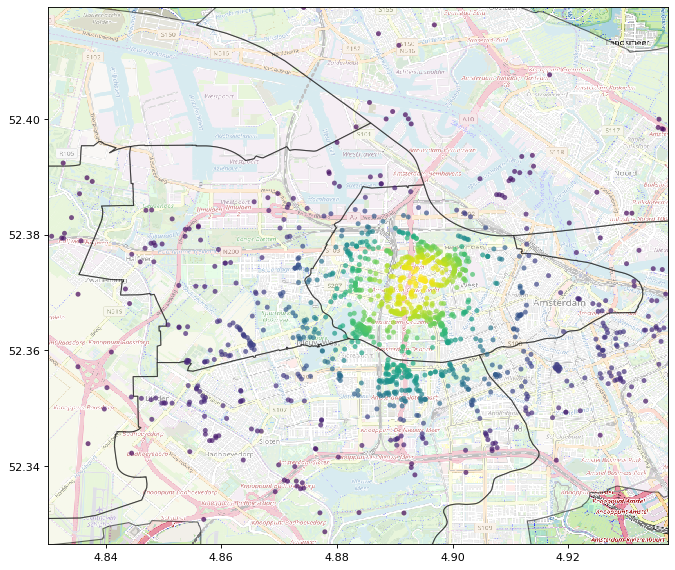

In [60]:
plt.figure(num=None, figsize=(10,10), dpi=80, facecolor='w', edgecolor='k')
fig = plt.plot()
ax1 = plt.axes()
ax1.set_xlim(bounding_box[0]+0.05, bounding_box[1]-0.08)
ax1.set_ylim(bounding_box[2]+0.04, bounding_box[3])
city.plot(ax=ax1, alpha=0.55, edgecolor="black", facecolor="white")
ax1.scatter(points["geometry"].x, points["geometry"].y, c=z, s=20, zorder=2, edgecolor='',  alpha=0.7)
ax1.imshow(osm_map, zorder=0, extent = bounding_box)
ax1.figure.savefig('./data/plot4.png', bbox_inches='tight')

## Use more specific symbols as map markers

If you want to change the markers in the map to more sophisticated ones, you could also use Font Awesome. Download the font from here and save it to `/resources/`. Edit the `symbols` dict to add symbols that might fit your subject, a cheat sheet for the unicode characters can be found on [the fontawesome website](https://fontawesome.com/cheatsheet). Just add a `\u` to any of the unicode characters.

In [61]:
fp = FontProperties(fname=r"./resources/Font Awesome 5 Free-Solid-900.otf") 

def get_marker(symbol):
    v, codes = TextToPath().get_text_path(fp, symbol)
    v = np.array(v)
    mean = np.mean([np.max(v,axis=0), np.min(v, axis=0)], axis=0)
    return Path(v-mean, codes, closed=False)

symbols = dict(map = "\uf041", map_alt = "\uf3c5")

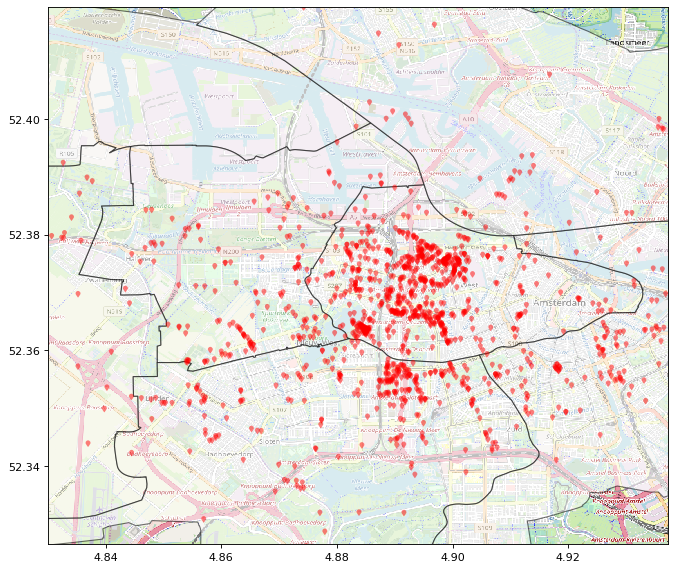

In [64]:
plt.figure(num=None, figsize=(10,10), dpi=80, facecolor='w', edgecolor='k')
fig = plt.plot()
ax1 = plt.axes()
ax1.set_xlim(bounding_box[0]+0.05, bounding_box[1]-0.08)
ax1.set_ylim(bounding_box[2]+0.04, bounding_box[3])
city.plot(ax=ax1, alpha=0.55, edgecolor="black", facecolor="white")
ax1.scatter(points["geometry"].x, points["geometry"].y, c="red", s=35, zorder=2, edgecolor='',  alpha=0.5, marker=get_marker(symbols["map"]))
ax1.imshow(osm_map, zorder=0, extent = bounding_box)
ax1.figure.savefig('./data/plot6.png', bbox_inches='tight')

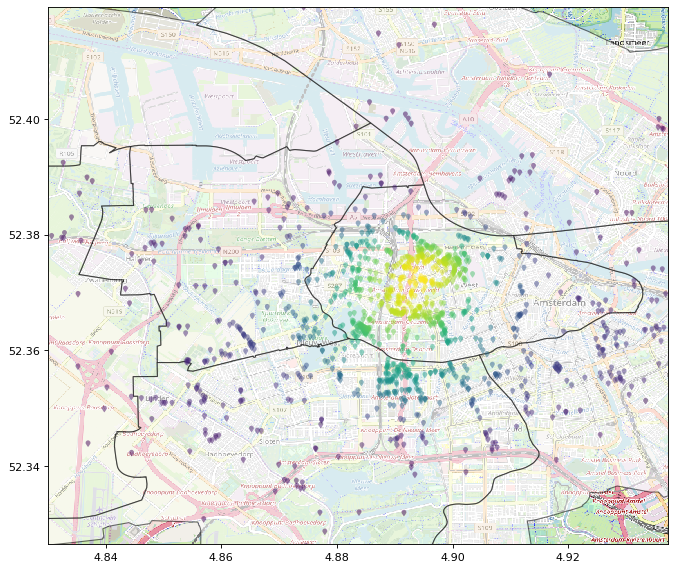

In [62]:
plt.figure(num=None, figsize=(10,10), dpi=80, facecolor='w', edgecolor='k')
fig = plt.plot()
ax1 = plt.axes()
ax1.set_xlim(bounding_box[0]+0.05, bounding_box[1]-0.08)
ax1.set_ylim(bounding_box[2]+0.04, bounding_box[3])
city.plot(ax=ax1, alpha=0.55, edgecolor="black", facecolor="white")
ax1.scatter(points["geometry"].x, points["geometry"].y, c=z, s=35, zorder=2, edgecolor='',  alpha=0.5, marker=get_marker(symbols["map"]))
ax1.imshow(osm_map, zorder=0, extent = bounding_box)
ax1.figure.savefig('./data/plot5.png', bbox_inches='tight')